In [2]:
import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv

##### JURNAL MODUL 2

##### NOMOR 1 susunlah penglihatan adit berikut menjadi satu gambar utuh

In [3]:
shenheScramble = plt.imread('senheScramble.jpg')
kurumi = plt.imread('kurumi.jpg')
megumin = plt.imread('megumin.jpg')

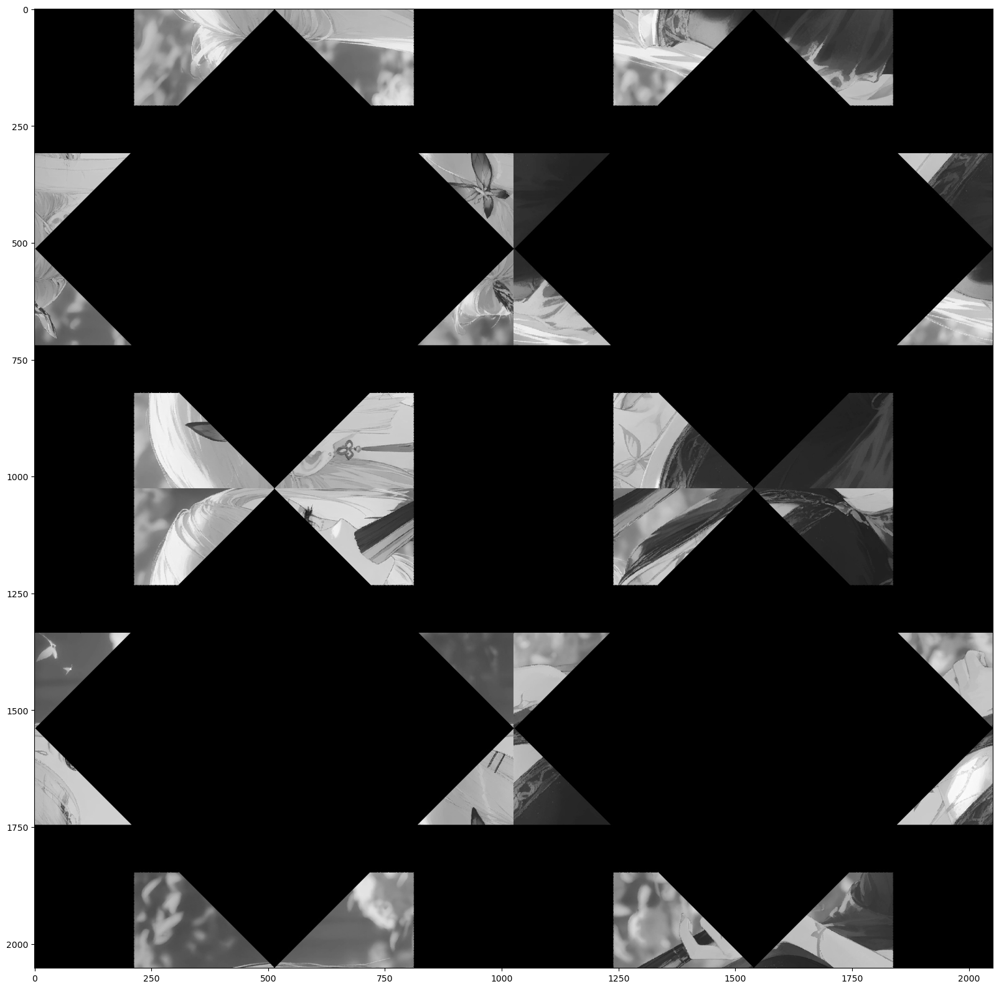

In [4]:
plt.figure(figsize=(20,20))
plt.imshow(shenheScramble, cmap='gray')

plt.figure(figsize=(20,20)): Membuat gambar baru dengan ukuran 20x20 inci. Ini mengatur ukuran gambar yang akan digunakan untuk menampilkan citra.

In [5]:
# 4 bagian citra
tinggi, lebar = shenheScramble.shape[:2]
shenheScramble1 = shenheScramble[:tinggi//2, :lebar//2]
shenheScramble2 = shenheScramble[:tinggi//2, lebar//2:]
shenheScramble3 = shenheScramble[tinggi//2:, :lebar//2]
shenheScramble4 = shenheScramble[tinggi//2:, lebar//2:]

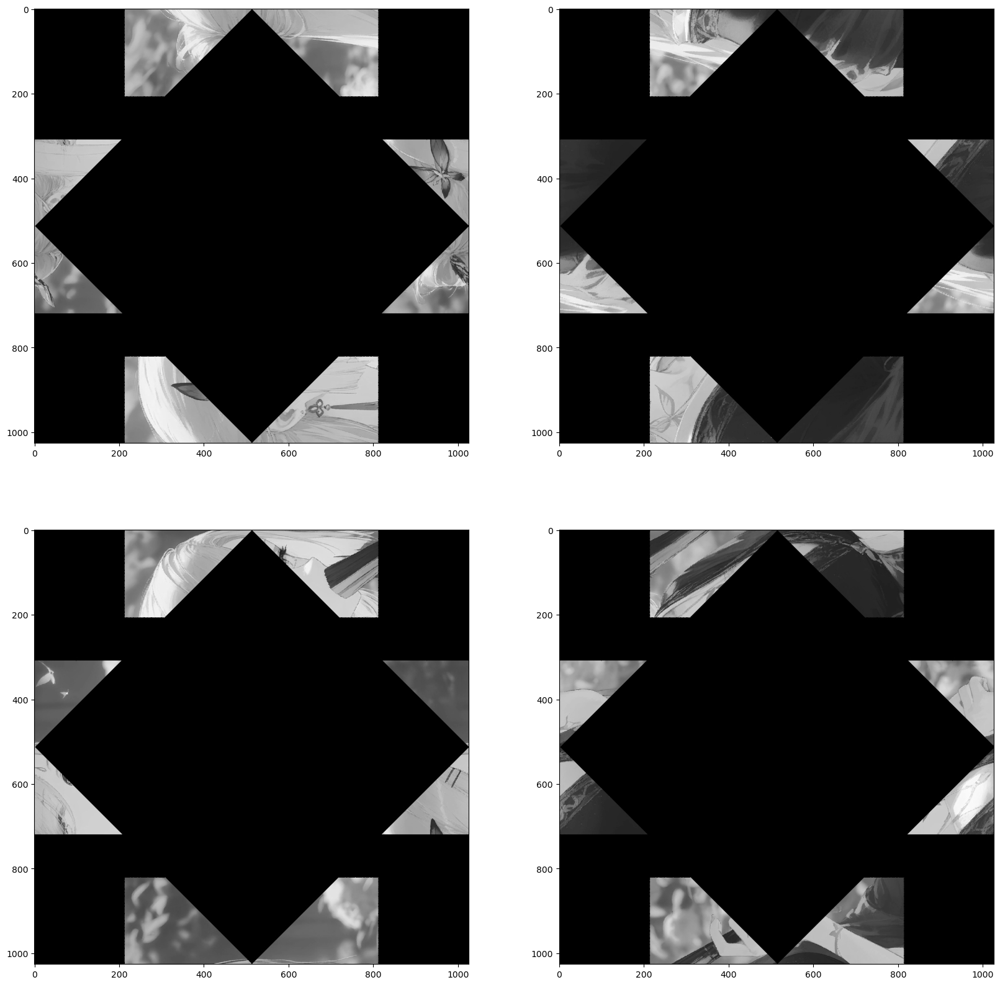

In [6]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(shenheScramble1, cmap='gray')
plt.subplot(222)
plt.imshow(shenheScramble2, cmap='gray')
plt.subplot(223)
plt.imshow(shenheScramble3, cmap='gray')
plt.subplot(224)
plt.imshow(shenheScramble4, cmap='gray')

Pemotongan Citra: Citra shenheScramble dipotong menjadi empat bagian yang sama ukurannya:
shenheScramble1: Ini adalah bagian alpha, yang merupakan bagian kiri atas citra.
shenheScramble2: Bagian beta, bagian kanan atas citra.
shenheScramble3: Bagian delta, bagian kiri bawah citra.
shenheScramble4: Bagian gamma, bagian kanan bawah citra.

In [7]:
def translasi(image, geser):
	tinggi, lebar = image.shape[:2]
	imagenew = np.zeros((tinggi, lebar)).astype(int)

	for y in range(0, 207):
		for x in range(200, 820):
			if not 0 <= image[y, x] <= 20:
				imagenew[y + geser , x] = image[y, x]
	
	for y in range(800, tinggi):
		for x in range(200, 820):
			if not 0 <= image[y, x] <= 20:
				imagenew[y - geser , x ] = image[y, x]
    
	for y in range(300, 720):
		for x in range(0, 210):
			if not 0 <= image[y, x] <= 20:
				imagenew[y, x + geser] = image[y, x]
	
	for y in range(300, 720):
		for x in range(820, lebar):
			if not 0 <= image[y, x] <= 20:
				imagenew[y, x - geser] = image[y, x]
    
	return imagenew

Merupakan Fungsi translasi ini mengimplementasikan translasi (geser) pada citra yang diberikan.

In [8]:
def rotate(image, angle):
	tinggi, lebar = image.shape[:2]
	
	citraRotated = np.zeros((tinggi, lebar)).astype(int) 
	theta = angle*np.pi/180
	
	center_x, center_y = lebar // 2, tinggi // 2
	for y in range(tinggi):
		for x in range(lebar):
			newX = int((x - center_x) * np.cos(theta) - (y - center_y) * np.sin(theta) + center_x)
			newY = int((x - center_x) * np.sin(theta) + (y - center_y) * np.cos(theta) + center_y)
		
			if 0 <= newX < lebar and 0 <= newY < tinggi:
				
				citraRotated[y,x] = image[newY,newX]
	return citraRotated

Merupakan Fungsi Rotasi yang mengimplementasikan rotasi pada citra yang diberikan sebesar sudut tertentu. 

In [9]:
def crop(image):
    return image[214:812, 307:718]

Fungsi ini melakukan pemotongan atau cropting pada citra yang diberikan.

In [10]:
def rgb2gray(image):
    tinggi, lebar = image.shape[:2]
    grayImg = np.zeros((tinggi, lebar)).astype(np.uint8)
    for i in range(tinggi):
        for j in range(lebar):
            grayImg[i,j] = int(0.2989*image[i][j][0] + 0.5870*image[i][j][1] + 0.1140*image[i][j][2])
            
    return grayImg

Fungsi ini mengkonversi citra warna dalam format RGB menjadi citra skala abu-abu.

In [11]:
shenheScramble1 = translasi(shenheScramble1, shenheScramble1.shape[0]//2)
shenheScramble2 = translasi(shenheScramble2, shenheScramble1.shape[0]//2)
shenheScramble3 = translasi(shenheScramble3, shenheScramble1.shape[0]//2)
shenheScramble4 = translasi(shenheScramble4, shenheScramble1.shape[0]//2)

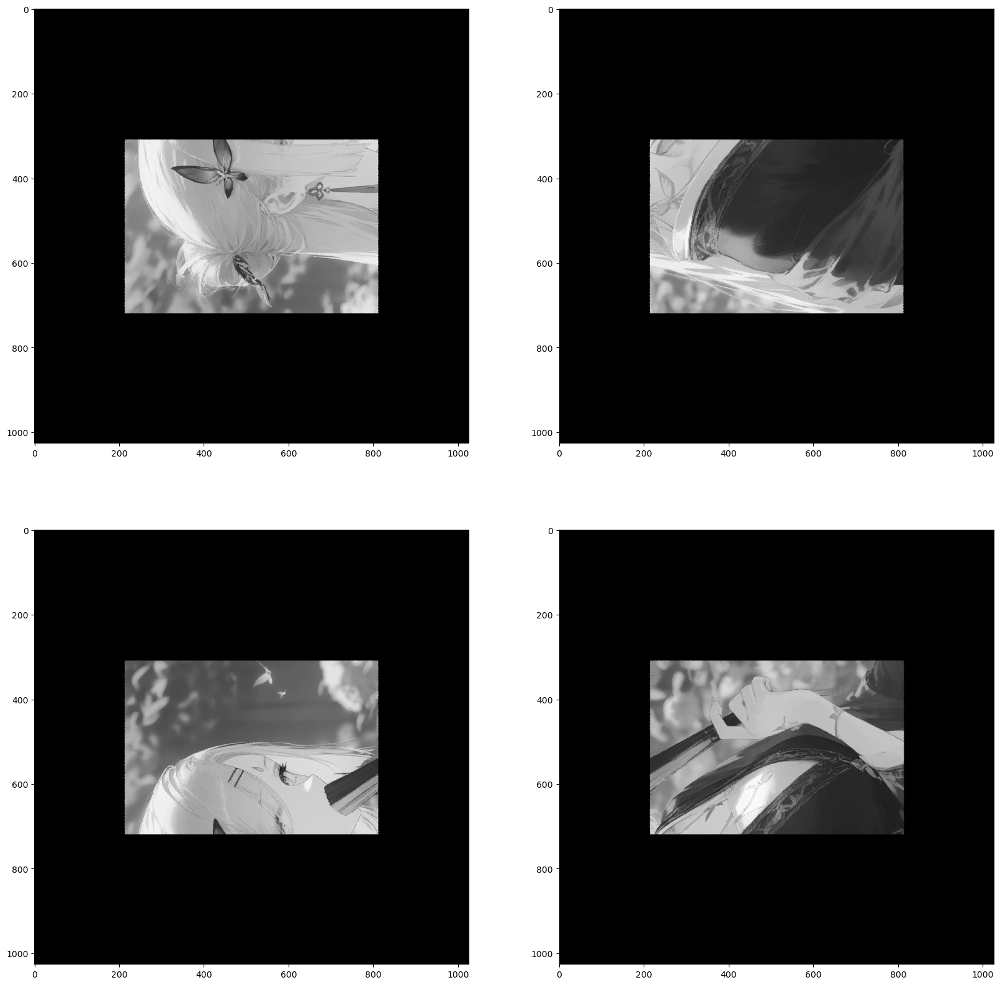

In [12]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(shenheScramble1, cmap='gray')
plt.subplot(222)
plt.imshow(shenheScramble2, cmap='gray')
plt.subplot(223)
plt.imshow(shenheScramble3, cmap='gray')
plt.subplot(224)
plt.imshow(shenheScramble4, cmap='gray')

In [13]:
shenheScramble1 = rotate(shenheScramble1, -90)
shenheScramble2 = rotate(shenheScramble2, -90)
shenheScramble3 = rotate(shenheScramble3, -90)
shenheScramble4 = rotate(shenheScramble4, -90)

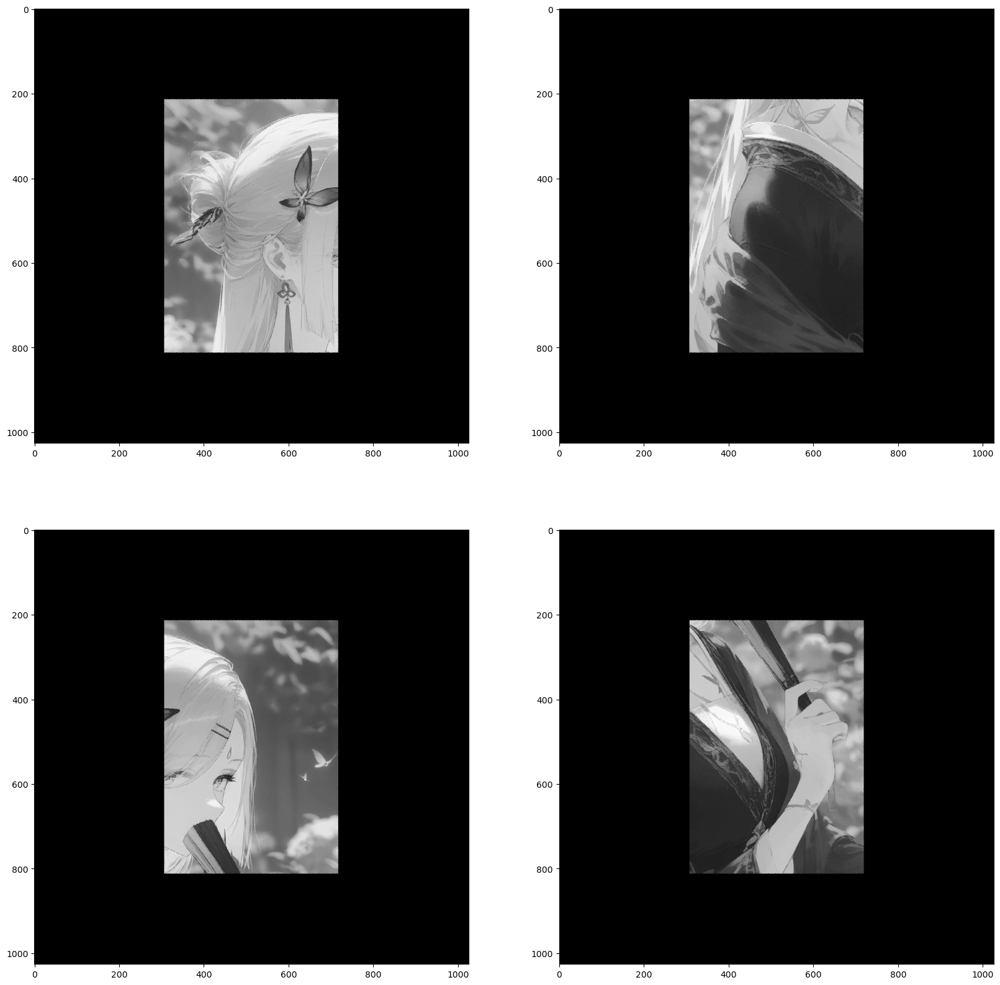

In [14]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(shenheScramble1, cmap='gray')
plt.subplot(222)
plt.imshow(shenheScramble2, cmap='gray')
plt.subplot(223)
plt.imshow(shenheScramble3, cmap='gray')
plt.subplot(224)
plt.imshow(shenheScramble4, cmap='gray')

In [15]:
shenheScramble1 = crop(shenheScramble1)
shenheScramble2 = crop(shenheScramble2)
shenheScramble3 = crop(shenheScramble3)
shenheScramble4 = crop(shenheScramble4)

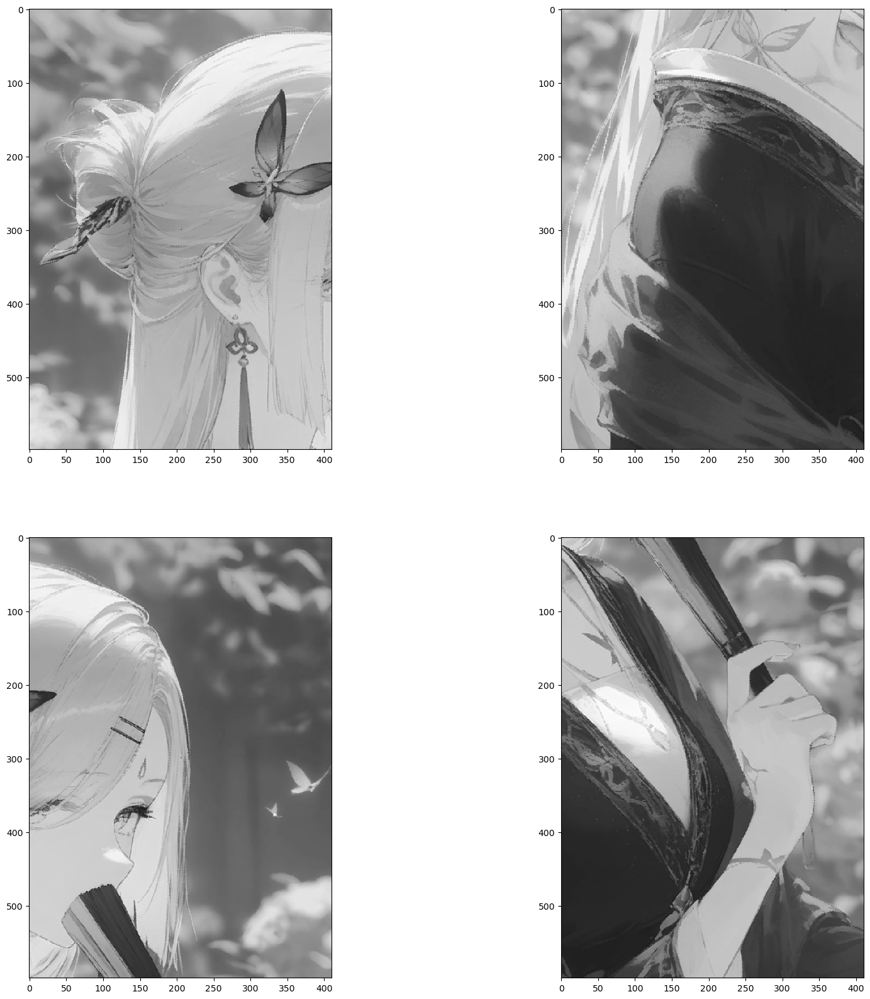

In [16]:
plt.figure(figsize=(20,20))
plt.subplot(221)
plt.imshow(shenheScramble1, cmap='gray')
plt.subplot(222)
plt.imshow(shenheScramble2, cmap='gray')
plt.subplot(223)
plt.imshow(shenheScramble3, cmap='gray')
plt.subplot(224)
plt.imshow(shenheScramble4, cmap='gray')

In [17]:
shenhe = np.zeros((shenheScramble1.shape[0]*2, shenheScramble1.shape[1]*2)).astype(np.uint8)
shenhe[:shenheScramble1.shape[0], :shenheScramble1.shape[1]] = shenheScramble1
shenhe[:shenheScramble3.shape[0], shenheScramble3.shape[1]:] = shenheScramble3
shenhe[shenheScramble2.shape[0]:, :shenheScramble2.shape[1]] = shenheScramble2
shenhe[shenheScramble4.shape[0]:, shenheScramble4.shape[1]:] = shenheScramble4

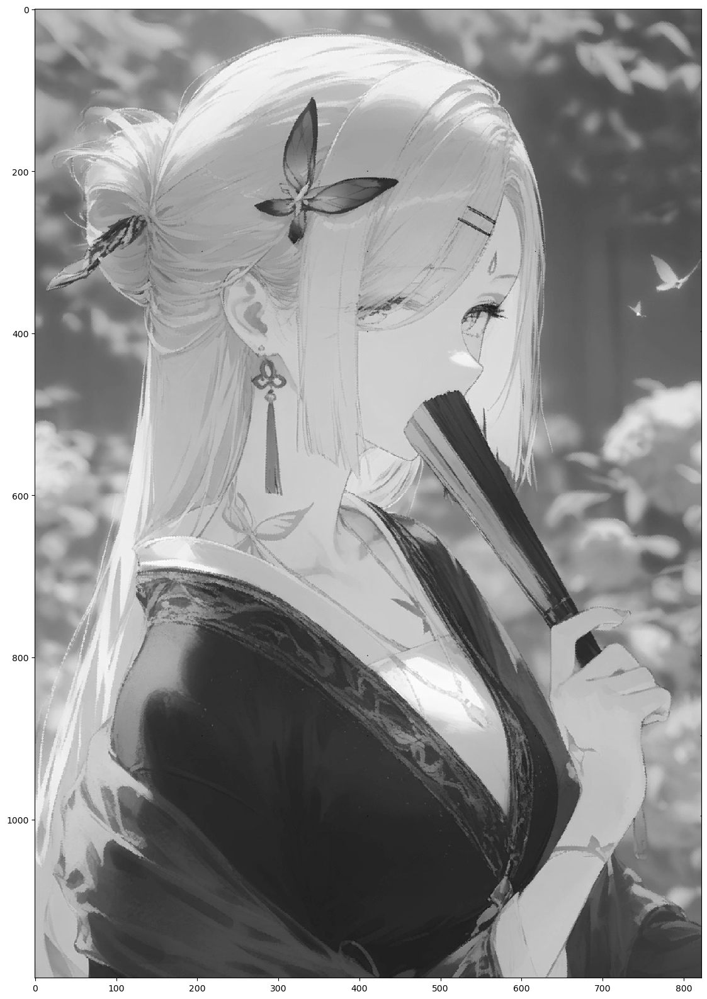

In [18]:
plt.figure(figsize=(20,20))
plt.imshow(shenhe, cmap='gray')

##### NOMOR 2 lakukanlah proses equalisasi terhadapat gambar dari nomer 1 dan tampilkan hasil historgram perbandingannya

In [19]:
def intensitasDerajatCitra(image):
    #mengambil nilai tinggi dan lebar pixel dari citra
	tinggi,lebar = image.shape
	#membuat array kosong
	jumlahPerGray = np.zeros(256).astype(int)
	#perulangan untuk mengscan dari setiap pixel
	for i in range(tinggi):
		for j in range(lebar):
			jumlahPerGray[image[i, j]]+=1

	return jumlahPerGray

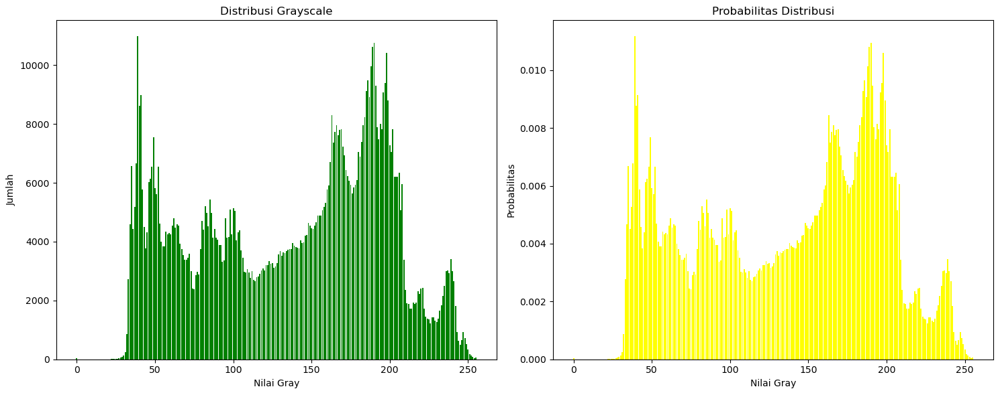

In [20]:
#membuat index
grayValue = [i for i in range(256)]
intensitasDerajatShenhe = intensitasDerajatCitra(shenhe)

# menampilkan histogram
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

axs[0].set_title('Distribusi Grayscale')
axs[0].set_xlabel('Nilai Gray')
axs[0].set_ylabel('Jumlah')
axs[0].bar(grayValue, intensitasDerajatShenhe, color='green')

axs[1].set_title('Probabilitas Distribusi')
axs[1].set_xlabel('Nilai Gray')
axs[1].set_ylabel('Probabilitas')
axs[1].bar(grayValue, intensitasDerajatShenhe / intensitasDerajatShenhe.sum(), color='yellow')

plt.tight_layout()
plt.show()

In [21]:
def findTarget(intensitasDerajat, image):
	tinggi, lebar = image.shape
	
	distKumulatif = np.zeros(256).astype(float)
	
	for i in range(256):
		distKumulatif[i] = np.sum(intensitasDerajat[0:i+1])

	normalisasiDistCum = (distKumulatif*255)/(tinggi*lebar)
	normalisasiDistCum = np.round(normalisasiDistCum).astype(int)

	return normalisasiDistCum

(-0.5, 821.5, 1195.5, -0.5)

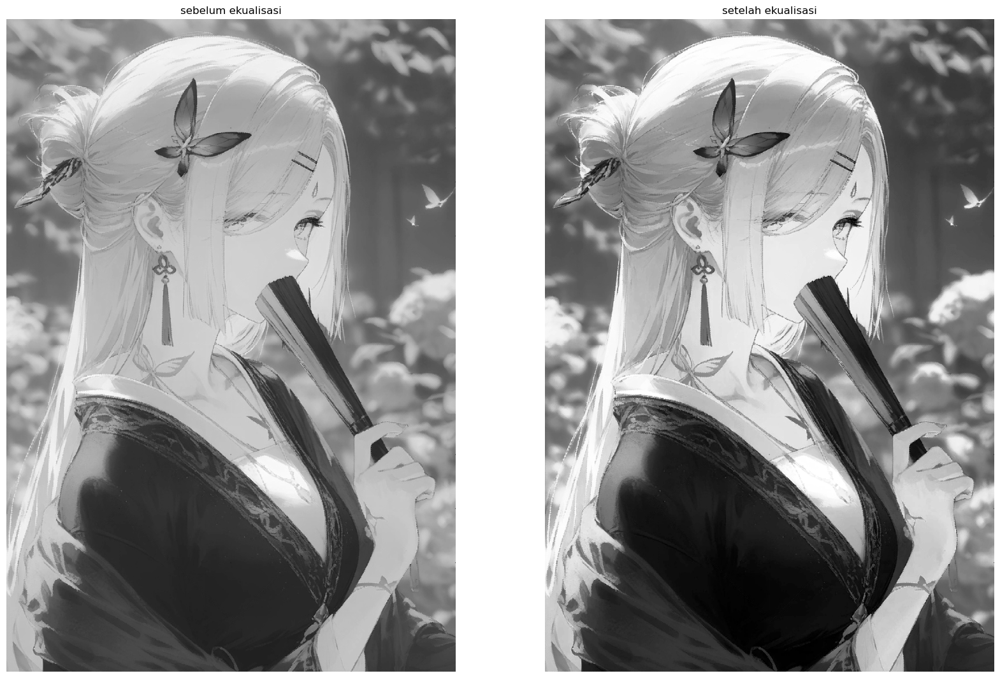

In [22]:
normalisasiTargetShenhe = findTarget(intensitasDerajatShenhe, shenhe)

tinggi, lebar = shenhe.shape
ekualisasiShenhe = np.zeros((tinggi, lebar)).astype(np.uint8)
for i in range(tinggi):
	for j in range(lebar):
		ekualisasiShenhe[i,j] = normalisasiTargetShenhe[shenhe[i,j]]

plt.figure(figsize=(20, 20)) 
plt.subplot(1, 2, 1)
plt.imshow(shenhe, cmap='gray')
plt.title('sebelum ekualisasi')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(ekualisasiShenhe , cmap='gray')
plt.title('setelah ekualisasi')
plt.axis('off')

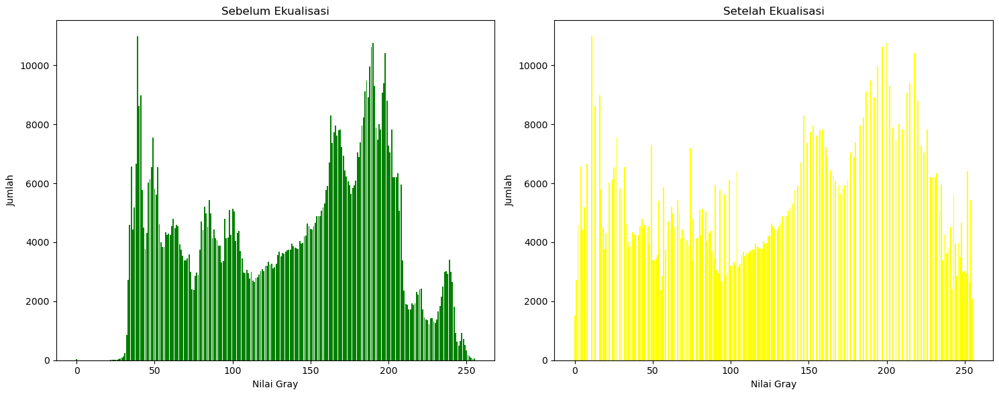

In [23]:
intensitasDerajatShenheEkual = intensitasDerajatCitra(ekualisasiShenhe)

fig, axs = plt.subplots(1, 2, figsize=(15, 6))

axs[0].set_title('Sebelum Ekualisasi')
axs[0].set_xlabel('Nilai Gray')
axs[0].set_ylabel('Jumlah')
axs[0].bar(grayValue, intensitasDerajatShenhe, color='green')

axs[1].set_title('Setelah Ekualisasi')
axs[1].set_xlabel('Nilai Gray')
axs[1].set_ylabel('Jumlah')
axs[1].bar(grayValue, intensitasDerajatShenheEkual, color='yellow')

plt.tight_layout()
plt.show()

##### NOMOR 3 lakukan spesifikasi gambar shenhe dengan target dari masing masing gambar kurumi dan megumin dan analisislah hasilnya dan simpulkan bagaimana hasil tersebut bisa menjadi seperti itu

In [24]:
kurumiGray = rgb2gray(kurumi)
meguminGray = rgb2gray(megumin)

In [25]:
intensitasDerajatKurumi = intensitasDerajatCitra(kurumiGray)
intensitasDerajatMegumin = intensitasDerajatCitra(meguminGray)

In [26]:
normalisasiTargetKurumi = findTarget(intensitasDerajatKurumi, kurumiGray)
normalisasiTargetMegumin = findTarget(intensitasDerajatMegumin, meguminGray)

In [27]:
def findMinimumTarget(normalisasiCitraOriginal, normalisasiCitraTarget):
    minAtIndex = np.zeros(256).astype(int)
    for i in range(255):
		
        min=256
        for j in range(255):
            newMin=abs(normalisasiCitraOriginal[i]-normalisasiCitraTarget[j])
			
			
            if min>newMin:
                min=newMin
                minAtIndex[i]=j

    return minAtIndex

In [28]:
minKurumiAtIndex = findMinimumTarget(normalisasiTargetShenhe, normalisasiTargetKurumi)
minMeguminAtIndex = findMinimumTarget(normalisasiTargetShenhe, normalisasiTargetMegumin)

(-0.5, 821.5, 1195.5, -0.5)

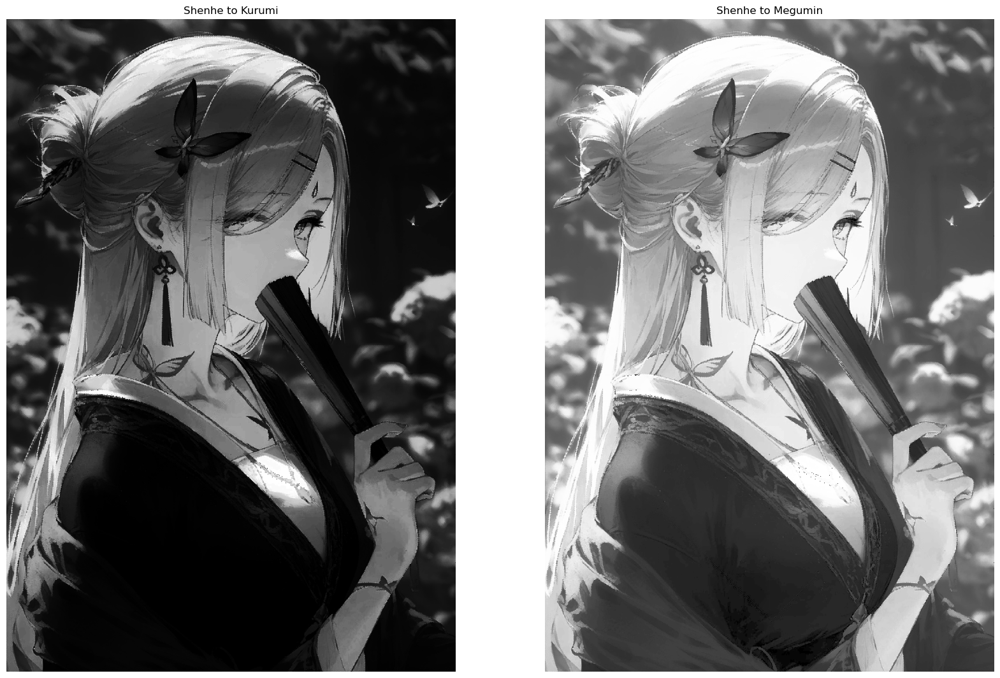

In [29]:
spesifikasiShenhe2Kurumi = np.zeros(shenhe.shape).astype(int)
spesifikasiShenhe2Megumin = np.zeros(shenhe.shape).astype(int)

for i in range(tinggi):
    for j in range(lebar):
        spesifikasiShenhe2Kurumi[i,j]=minKurumiAtIndex[shenhe[i,j]]
        spesifikasiShenhe2Megumin[i,j]=minMeguminAtIndex[shenhe[i,j]]

plt.figure(figsize=(20, 20))
plt.subplot(1, 2, 1)
plt.imshow(spesifikasiShenhe2Kurumi, cmap='gray')
plt.title('Shenhe to Kurumi')
plt.axis('off')
plt.subplot(1, 2, 2)
plt.imshow(spesifikasiShenhe2Megumin, cmap='gray')
plt.title('Shenhe to Megumin')
plt.axis('off')


In [30]:
def splitImage(image, M=1, N=1):
	tinggi, lebar = image.shape[:2]
	bagianTinggi = tinggi // M
	bagianLebar = lebar // N
	bagianCitra = []
	for i in range(M):
		for j in range(N):
			bagian = image[i*bagianTinggi:(i+1)*bagianTinggi, j*bagianLebar:(j+1)*bagianLebar]
			bagianCitra.append(bagian)
	return bagianCitra

In [31]:
def mergeImage(images, M=1, N=1):
	bagianTinggi, bagianLebar = images[0].shape[:2]
	tinggi = bagianTinggi * M
	lebar = bagianLebar * N
	image = np.zeros((tinggi, lebar)).astype(np.uint8)
	for i in range(M):
		for j in range(N):
			image[i*bagianTinggi:(i+1)*bagianTinggi, j*bagianLebar:(j+1)*bagianLebar] = images[i*N+j]
	return image

In [32]:
def citraMean(image):
    tinggi, lebar = image.shape[:2]
    hasil = 0
    for i in range(tinggi):
        for j in range(lebar):
            hasil += image[i, j]
    
    return hasil/(tinggi*lebar)

In [33]:
def specPecahan(images):
	listSpec = []

	for i in images:
		if np.mean(i) <= 128:
			tinggi, lebar = i.shape[:2]
			spesifikasiPecahan = np.zeros((tinggi, lebar)).astype(int)

			intensitasDerajatPecahan = intensitasDerajatCitra(i)
			normalisasiTargetPecahan = findTarget(intensitasDerajatPecahan, i)
			minKurumiAtIndex = findMinimumTarget(normalisasiTargetPecahan, normalisasiTargetKurumi)

			for y in range(tinggi):
				for x in range(lebar):
					spesifikasiPecahan[y, x] = minKurumiAtIndex[i[y, x]]
			
			listSpec.append(spesifikasiPecahan)
		else:
			tinggi, lebar = i.shape[:2]
			spesifikasiPecahan = np.zeros((tinggi, lebar)).astype(int)
            
			intensitasDerajatPecahan = intensitasDerajatCitra(i)
			normalisasiTargetPecahan = findTarget(intensitasDerajatPecahan, i)
			minMeguminAtIndex = findMinimumTarget(normalisasiTargetPecahan, normalisasiTargetMegumin)

			for y in range(tinggi):
				for x in range(lebar):
					spesifikasiPecahan[y, x] = minMeguminAtIndex[i[y, x]]
			
			listSpec.append(spesifikasiPecahan)
	
	return listSpec

##### NOMOR 4 pecahlah citra shenhe itu menjadi beberapa kombinasi dan berdarakan kondisi tertentu pecahan tersebut akan di spesifikasi terhadap citra megumin atau kurumi

(-0.5, 815.5, 1183.5, -0.5)

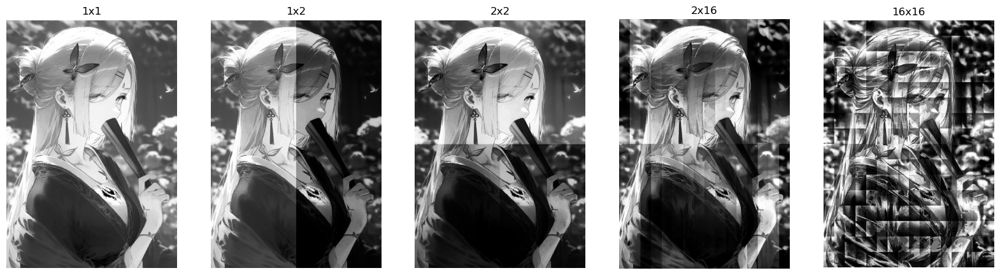

In [34]:
citraPecahan = splitImage(ekualisasiShenhe)
listSpec = specPecahan(citraPecahan)
citraHasil1x1 = mergeImage(listSpec)

citraPecahan = splitImage(ekualisasiShenhe,1,2)
listSpec = specPecahan(citraPecahan)
citraHasil1x2 = mergeImage(listSpec,1,2)

citraPecahan = splitImage(ekualisasiShenhe,2,2)
listSpec = specPecahan(citraPecahan)
citraHasil2x2 = mergeImage(listSpec,2,2)

citraPecahan = splitImage(ekualisasiShenhe,2,16)
listSpec = specPecahan(citraPecahan)
citraHasil2x16 = mergeImage(listSpec,2,16)

citraPecahan = splitImage(ekualisasiShenhe,16,16)
listSpec = specPecahan(citraPecahan)
citraHasil16x16 = mergeImage(listSpec,16,16)
plt.figure(figsize=(20, 20))
plt.subplot(1, 5, 1)
plt.title('1x1')
plt.imshow(citraHasil1x1, cmap='gray')
plt.axis('off')
plt.subplot(1, 5, 2)
plt.title('1x2')
plt.imshow(citraHasil1x2, cmap='gray')
plt.axis('off')
plt.subplot(1, 5, 3)
plt.title('2x2')
plt.imshow(citraHasil2x2, cmap='gray')
plt.axis('off')
plt.subplot(1, 5, 4)
plt.title('2x16')
plt.imshow(citraHasil2x16, cmap='gray')
plt.axis('off')
plt.subplot(1, 5, 5)
plt.title('16x16')
plt.imshow(citraHasil16x16, cmap='gray')
plt.axis('off')

##### NOMOR 5 analisis lah hasil beberapa hasil gambar tersebut dan simpulkan apa yang bisa di dapat dari melakukan spesifikasi dan spesifikasi terhadap segmentasi citra

terlihat bahwa gambar asli (ekualisasiShenhe) dipecah menjadi beberapa bagian menggunakan fungsi splitImage dengan parameter yang berbeda-beda. Kemudian, spesifikasi dilakukan terhadap pecahan-pecahan gambar tersebut menggunakan fungsi specPecahan. Setelah itu, gambar-gambar yang telah di-spesisfikasi tersebut digabung kembali menjadi satu gambar menggunakan fungsi mergeImage.

Dari hasil plot, terlihat bahwa hasil segmentasi dengan spesifikasi berbeda-beda menghasilkan gambar-gambar dengan resolusi yang berbeda pula (misalnya, 1x1, 1x2, 2x2, 2x16, dan 16x16). Ini menunjukkan bahwa spesifikasi terhadap segmentasi gambar dapat menghasilkan gambar-gambar dengan tingkat resolusi yang berbeda.

Kesimpulan yang bisa diambil dari hasil tersebut adalah bahwa dengan melakukan spesifikasi terhadap segmentasi citra, kita dapat mengontrol tingkat detail atau resolusi dari gambar hasil segmentasi. Dengan kata lain, spesifikasi memberikan kemampuan untuk menyesuaikan tingkat kompleksitas atau detail gambar yang diinginkan, sehingga dapat mempengaruhi representasi visual dari objek yang direpresentasikan dalam gambar tersebut.